In [45]:
import pandas as pd

#import data
file_name = "bankrupt_data.csv"
df = pd.read_csv(filepath_or_buffer = file_name, encoding = 'latin-1')

#check row and columns
df.shape

UsageError: Line magic function `%%time` not found.


In [46]:
%%time
#check data
df.head()

CPU times: user 275 µs, sys: 396 µs, total: 671 µs
Wall time: 678 µs


,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,operating gross margin,realized sales gross margin,operating profit rate,tax Pre-net interest rate,after-tax net interest rate,non-industry income and expenditure/revenue,...,net income to total assets,total assets to GNP price,No-credit interval,Gross profit to Sales,Net income to stockholder's Equity,liability to equity,Degree of financial leverage (DFL),Interest coverage ratio( Interest expense to EBIT ),one if net income was negative for the last two year zero otherwise,equity to liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,1,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,1,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,1,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,1,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,1,0.035490


In [3]:
#check data
df.tail()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,operating gross margin,realized sales gross margin,operating profit rate,tax Pre-net interest rate,after-tax net interest rate,non-industry income and expenditure/revenue,...,net income to total assets,total assets to GNP price,No-credit interval,Gross profit to Sales,Net income to stockholder's Equity,liability to equity,Degree of financial leverage (DFL),Interest coverage ratio( Interest expense to EBIT ),one if net income was negative for the last two year zero otherwise,equity to liability
6814,0,0.493687,0.539468,0.543230,0.604455,0.604462,0.998992,0.797409,0.809331,0.303510,...,0.799927,0.000466,0.623620,0.604455,0.840359,0.279606,0.027064,0.566193,1,0.029890
6815,0,0.475162,0.538269,0.524172,0.598308,0.598308,0.998992,0.797414,0.809327,0.303520,...,0.799748,0.001959,0.623931,0.598306,0.840306,0.278132,0.027009,0.566018,1,0.038284
6816,0,0.472725,0.533744,0.520638,0.610444,0.610213,0.998984,0.797401,0.809317,0.303512,...,0.797778,0.002840,0.624156,0.610441,0.840138,0.275789,0.026791,0.565158,1,0.097649
6817,0,0.506264,0.559911,0.554045,0.607850,0.607850,0.999074,0.797500,0.809399,0.303498,...,0.811808,0.002837,0.623957,0.607846,0.841084,0.277547,0.026822,0.565302,1,0.044009
6818,0,0.493053,0.570105,0.549548,0.627409,0.627409,0.998080,0.801987,0.813800,0.313415,...,0.815956,0.000707,0.626680,0.627408,0.841019,0.275114,0.026793,0.565167,1,0.233902


In [4]:
#check if there are missing values
df.info()
#There is no missing value

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6819 entries, 0 to 6818
Data columns (total 96 columns):
 #   Column                                                               Non-Null Count  Dtype  
---  ------                                                               --------------  -----  
 0   Bankrupt?                                                            6819 non-null   int64  
 1    ROA(C) before interest and depreciation before interest             6819 non-null   float64
 2    ROA(A) before interest and % after tax                              6819 non-null   float64
 3    ROA(B) before interest and depreciation after tax                   6819 non-null   float64
 4    operating gross margin                                              6819 non-null   float64
 5    realized sales gross margin                                         6819 non-null   float64
 6    operating profit rate                                               6819 non-null   float64
 7    tax P

In [5]:
#check if there are duplicated values
df.duplicated().sum()

0

In [6]:
'''
#check if the plot function works
%matplotlib inline

df['CFO to ASSETS'].hist(bins = 50)
'''


"\n#check if the plot function works\n%matplotlib inline\n\ndf['CFO to ASSETS'].hist(bins = 50)\n"

In [7]:
#method1 to check how many companies went bankrupt
count = df['Bankrupt?'].value_counts(sort = False)
count

0    6599
1     220
Name: Bankrupt?, dtype: int64

In [8]:
#method2 to check how many companies went bank
from collections import Counter
Counter(df['Bankrupt?'])

Counter({1: 220, 0: 6599})

In [9]:
#calculate percentage of bankruptcy
percent = lambda part, whole: float(part) / float(whole) * 100
no_bankruptcy = percent(count.loc[0],len(df))
yes_bankruptcy = percent(count.loc[1],len(df))
print(no_bankruptcy, yes_bankruptcy)

96.77372048687491 3.2262795131250916


<AxesSubplot:>

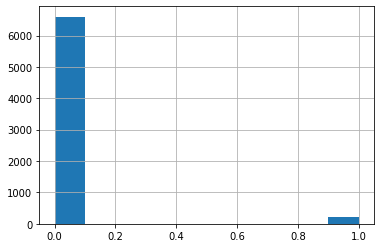

In [10]:
#check labels distribution
df['Bankrupt?'].hist(bins = 10)

#Since the labels are unbalanced, we need to solve this problem to obtain good performaces.

In [11]:
#now we want to split the dataset into training and test sets
from sklearn.model_selection import KFold, StratifiedKFold

x = df.copy()
y = df['Bankrupt?']

#use K-fold function to split data. 80% of the data will be training set and the rest of it will be test set.
skf = StratifiedKFold(n_splits = 5, shuffle = False)

for train_index, test_index in skf.split(x, y):
    print("TRAIN:", train_index, "TEST:", test_index)
    original_xtrain, original_xtest = x.iloc[train_index], x.iloc[test_index]
    original_ytrain, original_ytest = y.iloc[train_index], y.iloc[test_index]

TRAIN: [1104 1118 1132 ... 6816 6817 6818] TEST: [   0    1    2 ... 1383 1384 1385]
TRAIN: [   0    1    2 ... 6816 6817 6818] TEST: [1104 1118 1132 ... 2796 2797 2798]
TRAIN: [   0    1    2 ... 6816 6817 6818] TEST: [1860 1861 1862 ... 4136 4137 4138]
TRAIN: [   0    1    2 ... 6816 6817 6818] TEST: [2100 2147 2148 ... 5475 5476 5477]
TRAIN: [   0    1    2 ... 5475 5476 5477] TEST: [3749 3908 4071 ... 6816 6817 6818]


In [12]:
import numpy as np 

#check if the percentage of bankruptcy is similar between the train set and the test set 
train_unique_label, train_counts_label = np.unique(original_ytrain, return_counts = True)
test_unique_label, test_counts_label = np.unique(original_ytest, return_counts = True)

print(train_counts_label/len(original_ytrain))
print(test_counts_label/len(original_ytest))

#The distribution of bankruptcy is similar to the original dataset.

[0.96774194 0.03225806]
[0.96771827 0.03228173]


In [13]:
#export a training set and a test set as csv
original_xtrain.to_csv(r'C:\Users\jeongjaehui\Documents\Stats_404\JEONG-JAEHEE\bankrupt_training_set.csv', index = False, header=True)
original_xtest.to_csv(r'C:\Users\jeongjaehui\Documents\Stats_404\JEONG-JAEHEE\bankrupt_test_set.csv', index = False, header=True)

In [14]:
#shuffle the data before creating a subset that has balanced labels
df1 = original_xtrain.sample(frac = 1, random_state=1)

#check labels
df1['Bankrupt?'].value_counts(sort = False)

0    5280
1     176
Name: Bankrupt?, dtype: int64

In [15]:
yes_bankruptcy_df = df1.loc[df1['Bankrupt?'] == 1]

#get only 176 rows to have balanced labels
no_bankruptcy_df = df1.loc[df1['Bankrupt?'] == 0][:176]

#save a subset that has balanced labels
combined_df = pd.concat([yes_bankruptcy_df, no_bankruptcy_df])
df2 = combined_df.sample(frac = 1, random_state=1 )
df2.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,operating gross margin,realized sales gross margin,operating profit rate,tax Pre-net interest rate,after-tax net interest rate,non-industry income and expenditure/revenue,...,net income to total assets,total assets to GNP price,No-credit interval,Gross profit to Sales,Net income to stockholder's Equity,liability to equity,Degree of financial leverage (DFL),Interest coverage ratio( Interest expense to EBIT ),one if net income was negative for the last two year zero otherwise,equity to liability
2003,1,0.439624,0.485772,0.492371,0.594668,0.594668,0.998811,0.797196,0.809143,0.303516,...,0.767479,0.000640,0.623623,0.594667,0.837440,0.281231,0.026719,0.564788,1,0.025012
3303,1,0.278214,0.293120,0.305530,0.605990,0.605990,0.998705,0.796701,0.808649,0.302874,...,0.605230,0.000409,0.623787,0.605986,0.824988,0.279440,0.026770,0.565057,1,0.030572
1862,1,0.475991,0.491114,0.528347,0.590928,0.590928,0.998855,0.797233,0.809165,0.303490,...,0.767819,0.002796,0.624233,0.590928,0.836078,0.288367,0.026629,0.564244,1,0.017305
5451,0,0.579827,0.629634,0.612131,0.621521,0.621543,0.999274,0.797798,0.809603,0.303601,...,0.846300,0.001545,0.624560,0.621521,0.843306,0.277413,0.026807,0.565231,1,0.045667
308,0,0.482182,0.536960,0.531720,0.600592,0.600592,0.999042,0.797388,0.809290,0.303369,...,0.793943,0.009353,0.626380,0.600588,0.839864,0.280732,0.036329,0.569695,1,0.026229


<AxesSubplot:>

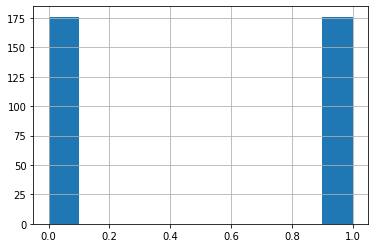

In [16]:
#check labels distribution
df2['Bankrupt?'].hist(bins = 10)
#The labels are balanced now.

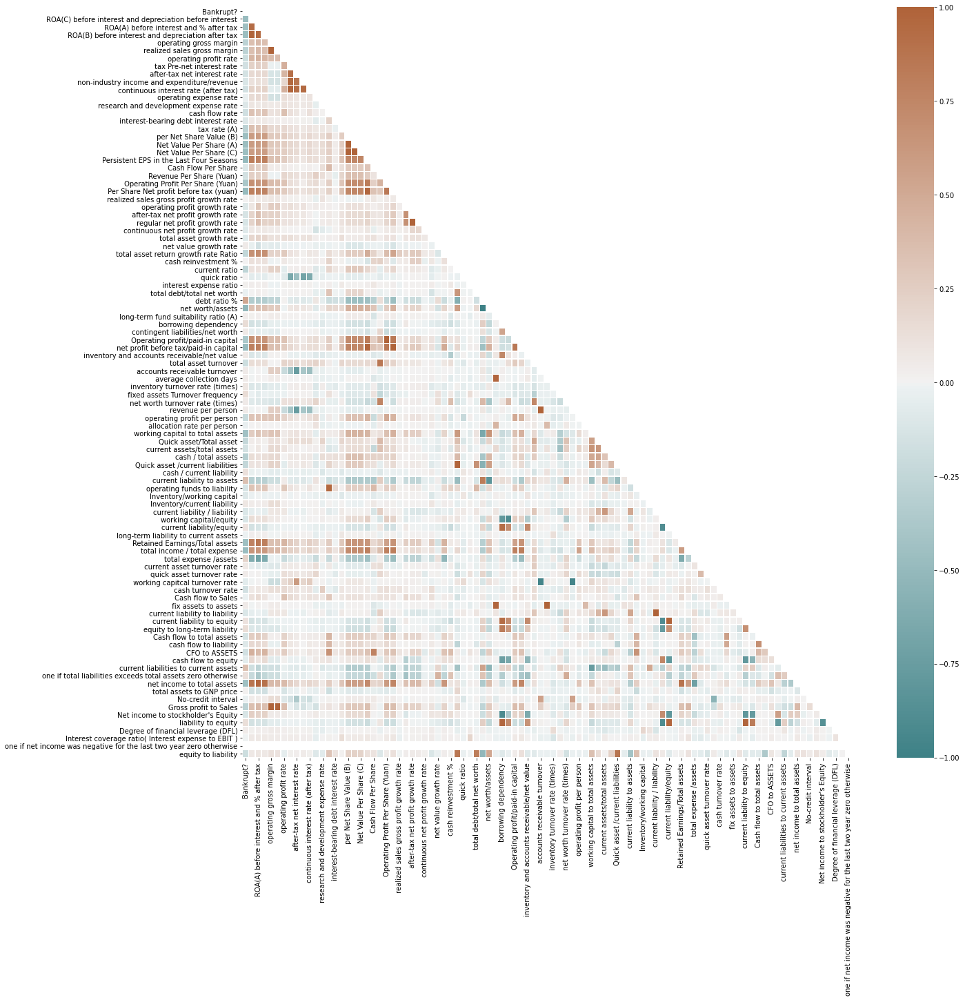

In [17]:
#perform EDA

#create a correlation heatmap
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize = (20, 20))

#using mask to have a triangle correlation heatmap
#mask = np.triu(np.ones_like(df2.corr(), dtype=np.bool))
corr = np.corrcoef(np.random.randn(96, 9216))
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True

#set the color of the heatmap
cmap = sns.diverging_palette(200, 30, as_cmap=True)
sns.heatmap(df2.corr(), mask = mask, cmap = cmap, linewidths=.5)
plt.show()

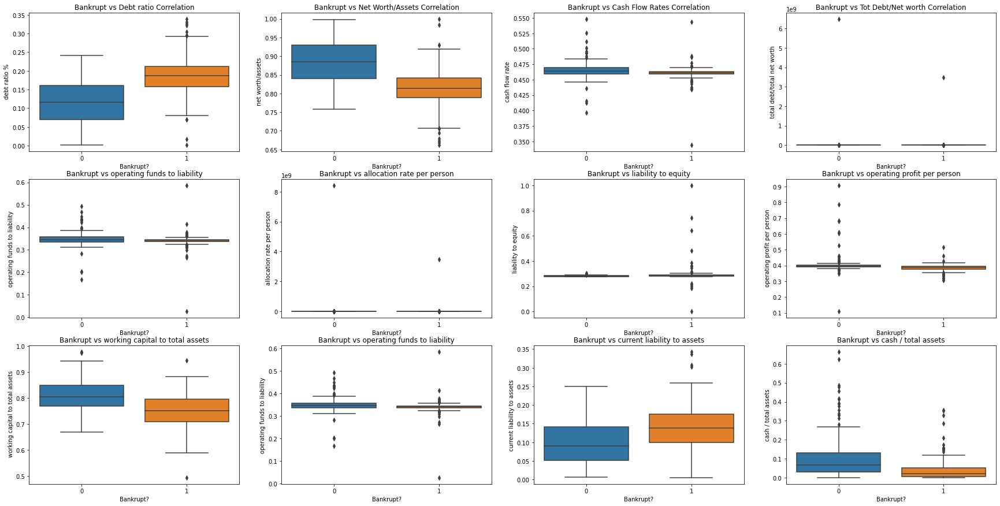

In [18]:
#plot feature with an interesting correlation

fig , ax = plt.subplots(nrows=3, ncols = 4, figsize=(30,15))

sns.boxplot(x='Bankrupt?', y=" debt ratio %", data=df2, ax=ax[0,0])
ax[0,0].set_title('Bankrupt vs Debt ratio Correlation')

sns.boxplot(x='Bankrupt?', y=" net worth/assets", data=df2, ax=ax[0,1])  
ax[0,1].set_title('Bankrupt vs Net Worth/Assets Correlation') 

sns.boxplot(x='Bankrupt?', y=" cash flow rate", data=df2, ax=ax[0,2])
ax[0,2].set_title('Bankrupt vs Cash Flow Rates Correlation')

sns.boxplot(x='Bankrupt?', y=" total debt/total net worth", data=df2, ax=ax[0,3]) 
ax[0,3].set_title('Bankrupt vs Tot Debt/Net worth Correlation')

###

sns.boxplot(x='Bankrupt?', y="operating funds to liability", data=df2, ax=ax[1,0])
ax[1,0].set_title('Bankrupt vs operating funds to liability')

sns.boxplot(x='Bankrupt?', y=" allocation rate per person", data=df2, ax=ax[1,1])  
ax[1,1].set_title('Bankrupt vs allocation rate per person') 

sns.boxplot(x='Bankrupt?', y="liability to equity", data=df2, ax=ax[1,2])
ax[1,2].set_title('Bankrupt vs liability to equity')

sns.boxplot(x='Bankrupt?', y=" operating profit per person", data=df2, ax=ax[1,3]) 
ax[1,3].set_title('Bankrupt vs operating profit per person')

###

sns.boxplot(x='Bankrupt?', y=" working capital to total assets", data=df2, ax=ax[2,0])
ax[2,0].set_title('Bankrupt vs working capital to total assets')

sns.boxplot(x='Bankrupt?', y="operating funds to liability", data=df2, ax=ax[2,1])  
ax[2,1].set_title('Bankrupt vs operating funds to liability') 

sns.boxplot(x='Bankrupt?', y="current liability to assets", data=df2, ax=ax[2,2])
ax[2,2].set_title('Bankrupt vs current liability to assets')

sns.boxplot(x='Bankrupt?', y="cash / total assets", data=df2, ax=ax[2,3]) 
ax[2,3].set_title('Bankrupt vs cash / total assets')

plt.show()

/Users/jeongjaehui/opt/anaconda3/envs/env-stats404-w20/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/jeongjaehui/opt/anaconda3/envs/env-stats404-w20/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/jeongjaehui/opt/anaconda3/envs/env-stats404-w20/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Plea

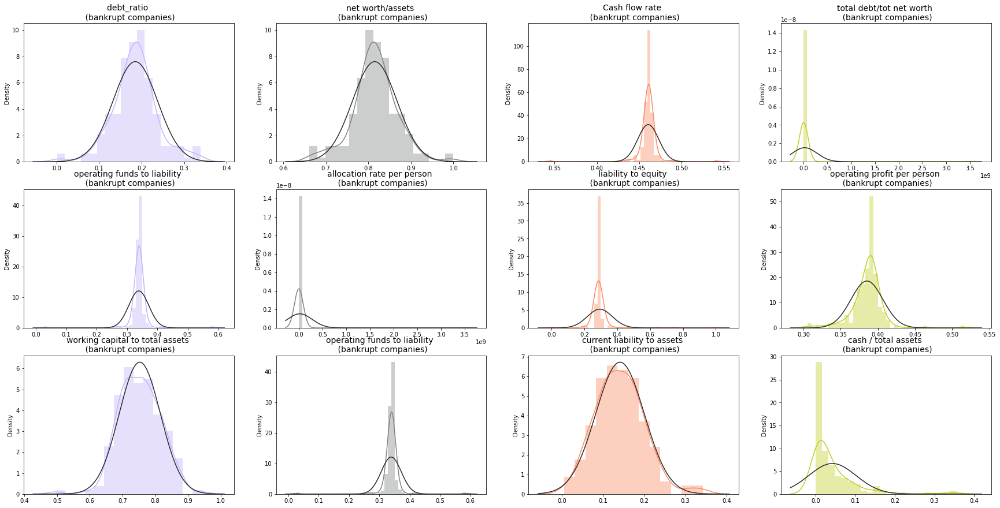

In [19]:
#plot the festure distributions for bankrupt companies

from scipy.stats import norm

fig, ax = plt.subplots(3,4, figsize=(30, 15))

debt_ratio = df2[' debt ratio %'].loc[df2['Bankrupt?'] == 1].values
sns.distplot(debt_ratio,ax=ax[0,0], fit=norm, color='#C5B3F9')
ax[0,0].set_title('debt_ratio \n (bankrupt companies)', fontsize=14)

net_worth_assets = df2[' net worth/assets'].loc[df2['Bankrupt?'] == 1].values
sns.distplot(net_worth_assets,ax=ax[0,1], fit=norm, color='#808282')
ax[0,1].set_title('net worth/assets \n (bankrupt companies)', fontsize=14)

cash_flow_rate = df2[' cash flow rate'].loc[df2['Bankrupt?'] == 1].values
sns.distplot(cash_flow_rate,ax=ax[0,2], fit=norm, color='#FB8861')
ax[0,2].set_title('Cash flow rate \n (bankrupt companies)', fontsize=14)

tot_debt_net = df2[' total debt/total net worth'].loc[df2['Bankrupt?'] == 1].values
sns.distplot(tot_debt_net ,ax=ax[0,3], fit=norm, color='#C2CD23')
ax[0,3].set_title('total debt/tot net worth \n (bankrupt companies)', fontsize=14)

###

debt_ratio = df2['operating funds to liability'].loc[df2['Bankrupt?'] == 1].values
sns.distplot(debt_ratio,ax=ax[1,0], fit=norm, color='#C5B3F9')
ax[1,0].set_title('operating funds to liability \n (bankrupt companies)', fontsize=14)

net_worth_assets = df2[' allocation rate per person'].loc[df2['Bankrupt?'] == 1].values
sns.distplot(net_worth_assets,ax=ax[1,1], fit=norm, color='#808282')
ax[1,1].set_title('allocation rate per person \n (bankrupt companies)', fontsize=14)

cash_flow_rate = df2['liability to equity'].loc[df2['Bankrupt?'] == 1].values
sns.distplot(cash_flow_rate,ax=ax[1,2], fit=norm, color='#FB8861')
ax[1,2].set_title('liability to equity \n (bankrupt companies)', fontsize=14)

tot_debt_net = df2[' operating profit per person'].loc[df2['Bankrupt?'] == 1].values
sns.distplot(tot_debt_net ,ax=ax[1,3], fit=norm, color='#C2CD23')
ax[1,3].set_title('operating profit per person \n (bankrupt companies)', fontsize=14)

###

debt_ratio = df2[' working capital to total assets'].loc[df2['Bankrupt?'] == 1].values
sns.distplot(debt_ratio,ax=ax[2,0], fit=norm, color='#C5B3F9')
ax[2,0].set_title('working capital to total assets \n (bankrupt companies)', fontsize=14)

net_worth_assets = df2['operating funds to liability'].loc[df2['Bankrupt?'] == 1].values
sns.distplot(net_worth_assets,ax=ax[2,1], fit=norm, color='#808282')
ax[2,1].set_title('operating funds to liability \n (bankrupt companies)', fontsize=14)

cash_flow_rate = df2['current liability to assets'].loc[df2['Bankrupt?'] == 1].values
sns.distplot(cash_flow_rate,ax=ax[2,2], fit=norm, color='#FB8861')
ax[2,2].set_title('current liability to assets \n (bankrupt companies)', fontsize=14)

tot_debt_net = df2['cash / total assets'].loc[df2['Bankrupt?'] == 1].values
sns.distplot(tot_debt_net ,ax=ax[2,3], fit=norm, color='#C2CD23')
ax[2,3].set_title('cash / total assets \n (bankrupt companies)', fontsize=14)

plt.show()

In [20]:
#Perform feature engineering.
#standardize data
from sklearn.preprocessing import StandardScaler
scale= StandardScaler()

names = list(df2)
standard = pd.DataFrame(scale.fit_transform(df2), columns = names)

standard.loc[standard['Bankrupt?'] == -1] = 0
standard

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,operating gross margin,realized sales gross margin,operating profit rate,tax Pre-net interest rate,after-tax net interest rate,non-industry income and expenditure/revenue,...,net income to total assets,total assets to GNP price,No-credit interval,Gross profit to Sales,Net income to stockholder's Equity,liability to equity,Degree of financial leverage (DFL),Interest coverage ratio( Interest expense to EBIT ),one if net income was negative for the last two year zero otherwise,equity to liability
0,1.0,-0.262644,-0.245987,-0.176908,-0.607459,-0.611774,-0.052449,0.105869,0.104442,0.134550,...,-0.113967,-0.085543,-0.029158,-0.607418,0.069187,-0.118688,-0.106298,-0.045412,0.0,-0.197634
1,1.0,-2.361330,-2.285701,-2.446488,0.236714,0.236232,-0.219553,-0.086538,-0.043580,-0.024153,...,-2.596714,-0.085543,0.001720,0.236485,-0.139573,-0.151621,-0.102520,0.005124,0.0,-0.105824
2,1.0,0.210210,-0.189424,0.260100,-0.886342,-0.891924,0.016326,0.120462,0.110920,0.128221,...,-0.108764,-0.085543,0.085312,-0.886211,0.046356,0.012595,-0.112920,-0.147984,0.0,-0.324903
3,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
4,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
347,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
348,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000
349,1.0,-0.339974,-0.195196,-0.289412,-0.929330,-0.935107,-0.253120,0.065535,0.072324,0.155507,...,-0.107095,-0.085543,0.103278,-0.929400,0.090822,-0.236909,-0.102964,-0.000551,0.0,12.568400
350,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000


/Users/jeongjaehui/opt/anaconda3/envs/env-stats404-w20/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/jeongjaehui/opt/anaconda3/envs/env-stats404-w20/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/jeongjaehui/opt/anaconda3/envs/env-stats404-w20/lib/python3.9/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Plea

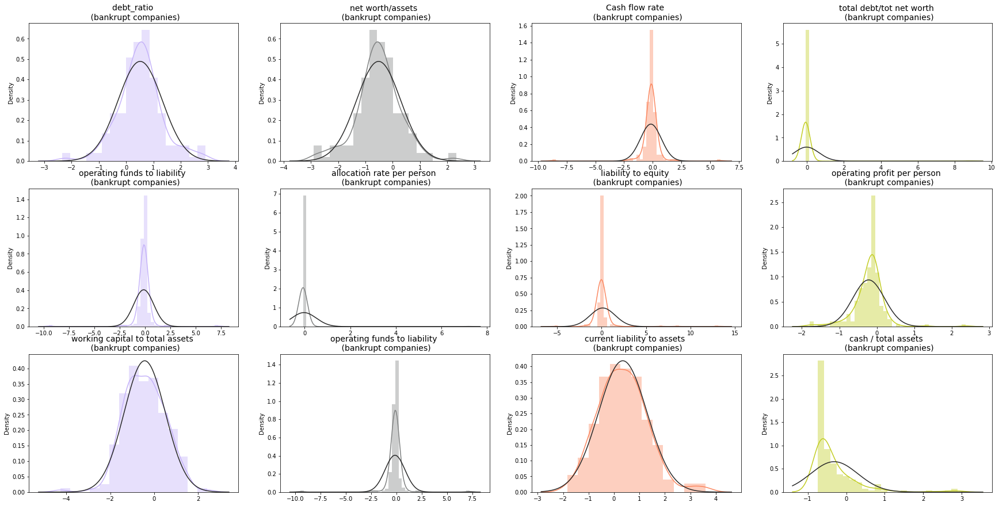

In [21]:
#plot the festure distributions again for bankrupt companies with the standardized data

from scipy.stats import norm

fig, ax = plt.subplots(3,4, figsize=(30, 15))

debt_ratio = standard[' debt ratio %'].loc[standard['Bankrupt?'] == 1].values
sns.distplot(debt_ratio,ax=ax[0,0], fit=norm, color='#C5B3F9')
ax[0,0].set_title('debt_ratio \n (bankrupt companies)', fontsize=14)

net_worth_assets = standard[' net worth/assets'].loc[standard['Bankrupt?'] == 1].values
sns.distplot(net_worth_assets,ax=ax[0,1], fit=norm, color='#808282')
ax[0,1].set_title('net worth/assets \n (bankrupt companies)', fontsize=14)

cash_flow_rate = standard[' cash flow rate'].loc[standard['Bankrupt?'] == 1].values
sns.distplot(cash_flow_rate,ax=ax[0,2], fit=norm, color='#FB8861')
ax[0,2].set_title('Cash flow rate \n (bankrupt companies)', fontsize=14)

tot_debt_net = standard[' total debt/total net worth'].loc[standard['Bankrupt?'] == 1].values
sns.distplot(tot_debt_net ,ax=ax[0,3], fit=norm, color='#C2CD23')
ax[0,3].set_title('total debt/tot net worth \n (bankrupt companies)', fontsize=14)

###

debt_ratio = standard['operating funds to liability'].loc[standard['Bankrupt?'] == 1].values
sns.distplot(debt_ratio,ax=ax[1,0], fit=norm, color='#C5B3F9')
ax[1,0].set_title('operating funds to liability \n (bankrupt companies)', fontsize=14)

net_worth_assets = standard[' allocation rate per person'].loc[standard['Bankrupt?'] == 1].values
sns.distplot(net_worth_assets,ax=ax[1,1], fit=norm, color='#808282')
ax[1,1].set_title('allocation rate per person \n (bankrupt companies)', fontsize=14)

cash_flow_rate = standard['liability to equity'].loc[standard['Bankrupt?'] == 1].values
sns.distplot(cash_flow_rate,ax=ax[1,2], fit=norm, color='#FB8861')
ax[1,2].set_title('liability to equity \n (bankrupt companies)', fontsize=14)

tot_debt_net = standard[' operating profit per person'].loc[standard['Bankrupt?'] == 1].values
sns.distplot(tot_debt_net ,ax=ax[1,3], fit=norm, color='#C2CD23')
ax[1,3].set_title('operating profit per person \n (bankrupt companies)', fontsize=14)

###

debt_ratio = standard[' working capital to total assets'].loc[standard['Bankrupt?'] == 1].values
sns.distplot(debt_ratio,ax=ax[2,0], fit=norm, color='#C5B3F9')
ax[2,0].set_title('working capital to total assets \n (bankrupt companies)', fontsize=14)

net_worth_assets = standard['operating funds to liability'].loc[standard['Bankrupt?'] == 1].values
sns.distplot(net_worth_assets,ax=ax[2,1], fit=norm, color='#808282')
ax[2,1].set_title('operating funds to liability \n (bankrupt companies)', fontsize=14)

cash_flow_rate = standard['current liability to assets'].loc[standard['Bankrupt?'] == 1].values
sns.distplot(cash_flow_rate,ax=ax[2,2], fit=norm, color='#FB8861')
ax[2,2].set_title('current liability to assets \n (bankrupt companies)', fontsize=14)

tot_debt_net = standard['cash / total assets'].loc[standard['Bankrupt?'] == 1].values
sns.distplot(tot_debt_net ,ax=ax[2,3], fit=norm, color='#C2CD23')
ax[2,3].set_title('cash / total assets \n (bankrupt companies)', fontsize=14)

plt.show()

#When we look at the plots, the distributions are the same. Therefore, we will use the original data instead of the standardized data.

In [22]:
from sklearn.model_selection import train_test_split

#split 'Bankrupt?' variable from df2

y2 = df2['Bankrupt?']
x2 = df2.drop(['Bankrupt?'], axis = 1)

#splite the data into training and valiation sets

x_train, x_val, y_train, y_val = train_test_split(x2, y2, test_size = 0.1, random_state = 2,stratify = y2, shuffle = True)


In [23]:
from sklearn.linear_model import LogisticRegression

#generate a logistics regression model

log_reg = LogisticRegression()
log_model = log_reg.fit(x_train, y_train)
log_pred = log_model.predict(x_val)

In [24]:
from sklearn.metrics import classification_report

#check a classification
print(classification_report(y_val, log_pred))


              precision    recall  f1-score   support

           0       0.60      0.83      0.70        18
           1       0.73      0.44      0.55        18

    accuracy                           0.64        36
   macro avg       0.66      0.64      0.62        36
weighted avg       0.66      0.64      0.62        36



In [25]:
#check coefficient
log_model.coef_[0]

array([-1.59394091e-17, -1.86065963e-17, -1.66873715e-17,  4.13562955e-18,
        4.15307147e-18,  1.03434228e-17,  8.07506111e-18,  8.18632185e-18,
        2.88872699e-18,  7.91290749e-18,  1.37017340e-12, -4.80120505e-11,
        3.64927794e-18, -3.92066663e-09, -1.90735013e-17, -5.72779395e-18,
       -5.77083244e-18, -5.74151538e-18, -7.74055355e-18,  2.47676081e-18,
       -1.22595324e-18, -3.77667209e-18, -7.06068916e-18,  3.06416863e-19,
        8.46367765e-18,  6.09179509e-18,  6.10043616e-18,  2.08015892e-18,
       -4.53344127e-11,  3.83079571e-09,  2.51758342e-18,  4.08282053e-18,
       -1.95332792e-18, -1.65343086e-11,  6.58340457e-18, -1.26371982e-10,
        2.11435327e-17, -1.07268661e-17, -8.24179174e-20,  6.92375373e-18,
        1.88553577e-19, -3.70416640e-18, -6.64196123e-18,  5.14758432e-18,
       -4.28730981e-18,  9.49956261e-10,  7.29088562e-11,  6.63485131e-11,
        8.90826905e-11,  2.44171319e-18,  5.48950135e-09, -1.30874170e-18,
       -3.17019940e-09, -

In [26]:
#use CatBoost to find another model

from catboost import CatBoostClassifier

params = {'loss_function':'Logloss',
          'eval_metric':'BalancedAccuracy',
          'verbose': 176,
         }

cat = CatBoostClassifier(**params)
cat_model = cat.fit(x_train,y_train,
                     eval_set = (x_val,y_val),
                     use_best_model=True,
                     verbose = 0,
                     plot=True)

cat_pred = cat_model.predict(x_val)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [27]:
print(classification_report(y_val, cat_pred))

              precision    recall  f1-score   support

           0       0.84      0.89      0.86        18
           1       0.88      0.83      0.86        18

    accuracy                           0.86        36
   macro avg       0.86      0.86      0.86        36
weighted avg       0.86      0.86      0.86        36



In [28]:
#check features' importance of this model
feat_imp_cat = cat_model.get_feature_importance(prettified=True)
important_features = feat_imp_cat.iloc[:12,0]
feat_imp_cat[:13]

,Feature Id,Importances
0,non-industry income and expenditure/revenue,15.930644
1,net worth/assets,15.703351
2,Net Value Per Share (C),15.643620
3,liability to equity,12.676986
4,Gross profit to Sales,11.218232
5,interest expense ratio,6.818886
6,Inventory/current liability,6.540078
7,Cash flow to total assets,5.790672
8,net income to total assets,5.716594
9,tax Pre-net interest rate,2.450486


training set
              precision    recall  f1-score   support

           0       0.98      0.65      0.78      5280
           1       0.05      0.57      0.10       176

    accuracy                           0.65      5456
   macro avg       0.52      0.61      0.44      5456
weighted avg       0.95      0.65      0.76      5456

                 Predicted Nagative  Predicted Positive
Actual Negative                3452                1828
Actual Positive                  75                 101
AUC: 0.65


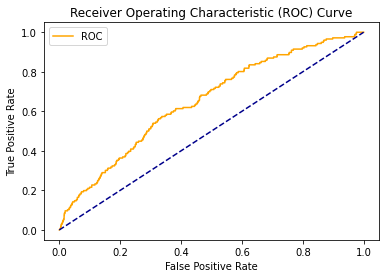

In [29]:
#apply the logistic regression model to the training set
#estimate 1 (baseline) model and evaluate model performance
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve

y_training_set = df1['Bankrupt?']
x_training_set = df1.drop(['Bankrupt?'], axis = 1)

log_pred = log_model.predict(x_training_set)
print('training set')
print(classification_report(y_training_set, log_pred))
#The accuracy is 65%.

#create a confusion matrix using the training set
print(pd.DataFrame(confusion_matrix(y_training_set, log_pred), columns = ['Predicted Nagative', 'Predicted Positive'], index = ['Actual Negative', 'Actual Positive']))

#Define a python function to plot the ROC curves.
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()
    
#plot a ROC Curve
probs = log_model.predict_proba(x_training_set)
positive_probs = probs[:, 1]
auc = roc_auc_score(y_training_set, positive_probs)
print('AUC: %.2f' % auc)

fpr, tpr, thresholds = roc_curve(y_training_set, positive_probs)
plot_roc_curve(fpr, tpr)

In [30]:
#apply the logistic regression model to the test set
df3 = original_xtest
y_test_set = df3['Bankrupt?']
x_test_set = df3.drop(['Bankrupt?'], axis = 1)
print('------------------------------------------------------ \n test set')
log_pred = log_model.predict(x_test_set)
print(classification_report(y_test_set, log_pred))
#The accuracy is 81%. Even though the accuracy is high, since the labels are highly unbalanced, the accuracy is not important.

------------------------------------------------------ 
 test set
              precision    recall  f1-score   support

           0       0.97      0.81      0.88      1319
           1       0.05      0.32      0.09        44

    accuracy                           0.79      1363
   macro avg       0.51      0.56      0.49      1363
weighted avg       0.94      0.79      0.86      1363



training set
              precision    recall  f1-score   support

           0       0.99      0.84      0.91      5280
           1       0.16      0.86      0.26       176

    accuracy                           0.84      5456
   macro avg       0.57      0.85      0.59      5456
weighted avg       0.97      0.84      0.89      5456

AUC: 0.92


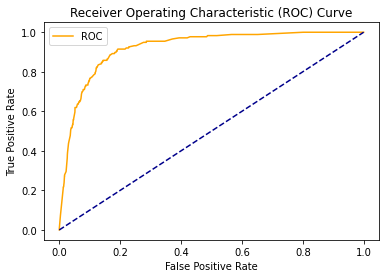

In [31]:
#estimate 1 (different) model and/or loss function to improve model performance
#apply the catboost model to the training set

cat_pred = cat_model.predict(x_training_set)
print('training set')
print(classification_report(y_training_set, cat_pred))
#The accuracy is 83%.

#plot a ROC Curve
probs = cat_model.predict_proba(x_training_set)
positive_probs = probs[:, 1]
auc = roc_auc_score(y_training_set, positive_probs)
print('AUC: %.2f' % auc)

fpr, tpr, thresholds = roc_curve(y_training_set, positive_probs)
plot_roc_curve(fpr, tpr)

In [32]:
#apply the catboost model to the test set
cat_pred = cat_model.predict(x_test_set)
print('------------------------------------------------------ \n test set')
print(classification_report(y_test_set, cat_pred))
#The accuracy is 88%.

------------------------------------------------------ 
 test set
              precision    recall  f1-score   support

           0       1.00      0.89      0.94      1319
           1       0.21      0.89      0.34        44

    accuracy                           0.89      1363
   macro avg       0.60      0.89      0.64      1363
weighted avg       0.97      0.89      0.92      1363



- Interpret results of model
  : Precision is the proportion of predictions of that class that are true. I will interpret results of 2 models applying to the test set. For the logistic regression model, 97% of the predictions for the class 0 are correctly classified, and 3% are not. For the class 1, only 6% of the predictions are actually of the predicted class, and 94% are of the opposite class. Recall is the proportion of the true positives that are identified as such. This means that the model is correctly indentifiying 83% of the class 0s, and 34% of the class 1s. The accuracy is 81%. Like I mentioned, since the labels are highly unbalanced, the accuracy can't be an important indicator to evaluate the model. When we look at the classification report using the catboost model, the percentage of the predictions for the class 1 increased by 15%. The percentage of the recall for the class 1 increased significantly as well. Therefore, the second model is a better model. However, we still missed 11% of the bankrupt companies, so I need to improve the model performance.
  
- Used results to answer business question you posed
  : There are 12 important features to predict which companies will face bankrupt. I printed the important features, please see below.

- Write-up a summary of what you did and why in "Methodology" section of README, referencing 3+ cells, figures and/or tables
  : The summary is in the README file.
 

In [33]:
#when the random state of train_test_split is 2.
print(important_features)

0      non-industry income and expenditure/revenue
1                                 net worth/assets
2                          Net Value Per Share (C)
3                              liability to equity
4                            Gross profit to Sales
5                           interest expense ratio
6                      Inventory/current liability
7                        Cash flow to total assets
8                       net income to total assets
9                        tax Pre-net interest rate
10                   current liability / liability
11     inventory and accounts receivable/net value
Name: Feature Id, dtype: object


AUC: 0.41


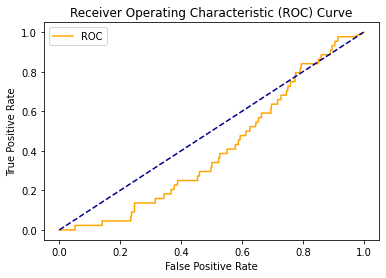

In [35]:
#use only these 12 features to generate a logistics regression model
#since there was an error using the small subset that has balanced labels, I used training set and used class_weight parameter.

log_reg = LogisticRegression(class_weight='balanced', max_iter=10000)
X = x_training_set[important_features]
log_model = log_reg.fit(X, y_training_set)
log_pred = log_model.predict(x_test_set[important_features])

#plot a ROC Curve
probs = log_model.predict_proba(x_test_set[important_features])
positive_probs = probs[:, 1]
auc = roc_auc_score(y_test_set, positive_probs)
print('AUC: %.2f' % auc)

fpr, tpr, thresholds = roc_curve(y_test_set, positive_probs)
plot_roc_curve(fpr, tpr)

3 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(93,)
AUC: 0.69


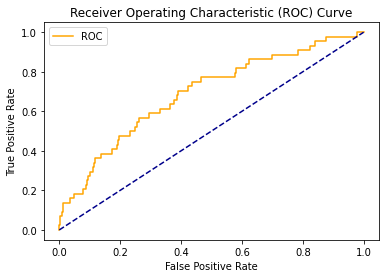

4 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(86,)
AUC: 0.70


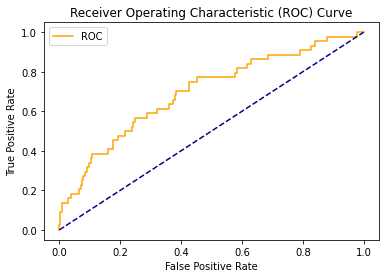

5 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(87,)
AUC: 0.69


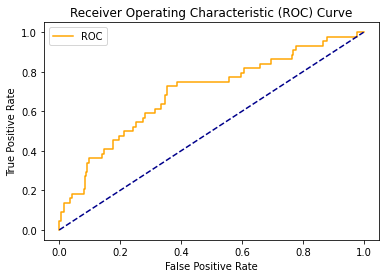

6 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(93,)
AUC: 0.69


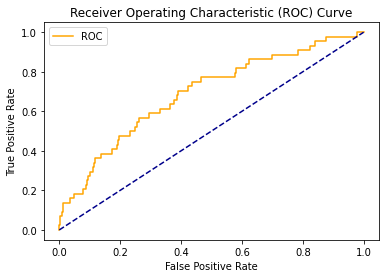

7 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(50,)
AUC: 0.54


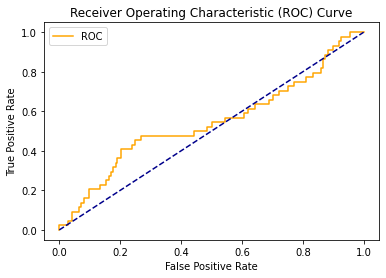

8 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(21,)
AUC: 0.57


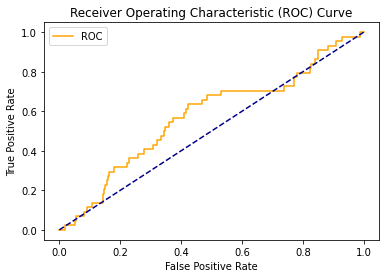

9 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(85,)
AUC: 0.61


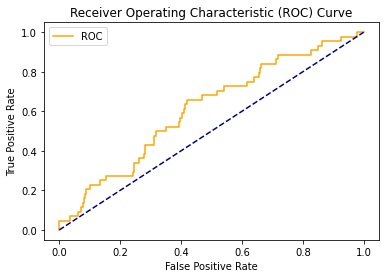

10 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(19,)
AUC: 0.51


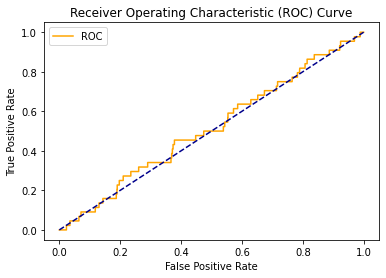

11 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(89,)
AUC: 0.69


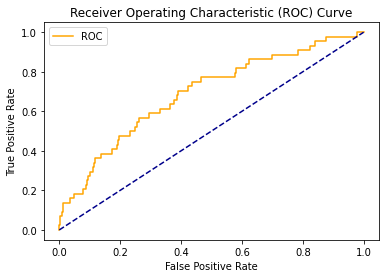

12 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(93,)
AUC: 0.69


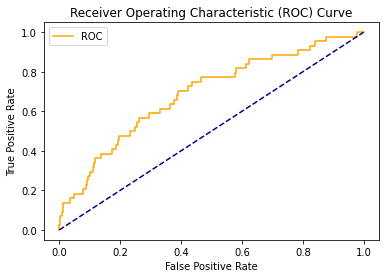

13 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(75,)
AUC: 0.54


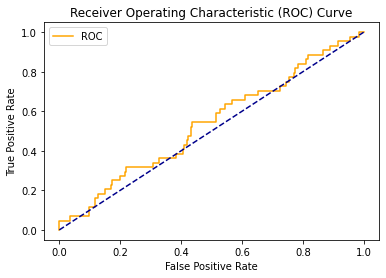

14 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(89,)
AUC: 0.62


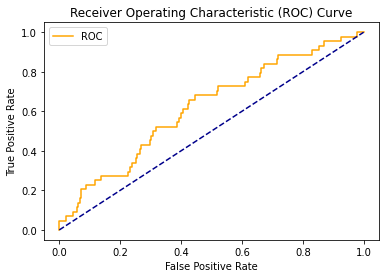

15 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(57,)
AUC: 0.60


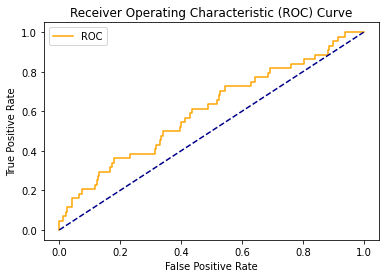

16 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(29,)
AUC: 0.65


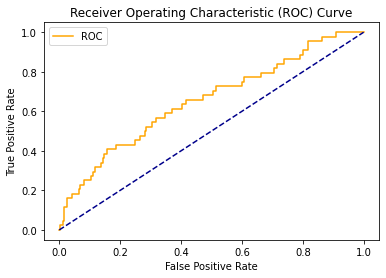

17 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(48,)
AUC: 0.54


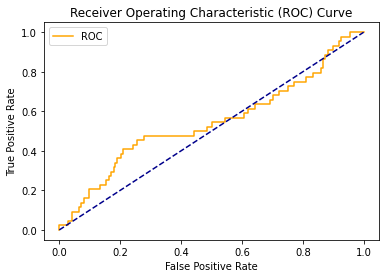

18 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(6,)
AUC: 0.96


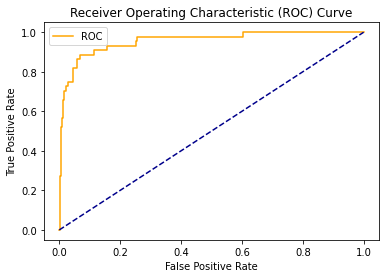

19 randome state


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(46,)
AUC: 0.54


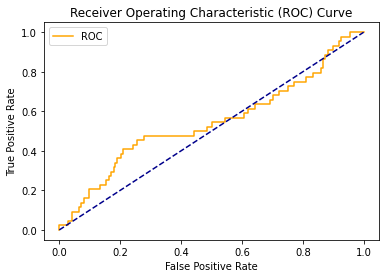

In [36]:
#The impartant features were changed depending on random state, therefore we want to check if there are better features that can predict the target value.

for i in range(3,20):
    print(i, 'randome state')
    x_train, x_val, y_train, y_val = train_test_split(x2, y2, test_size = 0.1, random_state = i,stratify = y2, shuffle = True)

    #generate a model with random state 7
    params = {'loss_function':'Logloss',
              'eval_metric':'BalancedAccuracy',
              'verbose': 176,
             }

    cat = CatBoostClassifier(**params)
    cat_model = cat.fit(x_train,y_train,
                         eval_set = (x_val,y_val),
                         use_best_model=True,
                         verbose = 0,
                         plot=True)

    cat_pred = cat_model.predict(x_val)

    #check features' importance of this model
    feat_imp_cat = cat_model.get_feature_importance(prettified=True)
    important_features = feat_imp_cat.loc[feat_imp_cat['Importances'] > 0]
    important_features = important_features.iloc[:,0]
    
    #print the number of important features
    print(important_features.shape)

    #since there was an error using the small subset, I used training set and used class_weight parameter.

    log_reg = LogisticRegression(class_weight='balanced', max_iter=10000)
    X = x_training_set[important_features]
    log_model = log_reg.fit(X, y_training_set)
    log_pred = log_model.predict(x_test_set[important_features])

    #plot a ROC Curve
    probs = log_model.predict_proba(x_test_set[important_features])
    positive_probs = probs[:, 1]
    auc = roc_auc_score(y_test_set, positive_probs)
    print('AUC: %.2f' % auc)

    fpr, tpr, thresholds = roc_curve(y_test_set, positive_probs)
    plot_roc_curve(fpr, tpr)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

(6,)
AUC: 0.96


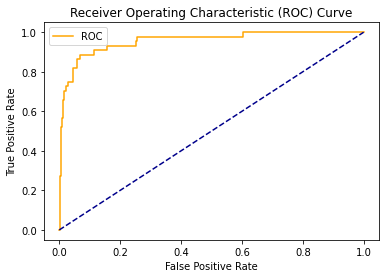

------------------------------------------------------ 
 test set
              precision    recall  f1-score   support

           0       1.00      0.89      0.94      1319
           1       0.21      0.89      0.34        44

    accuracy                           0.89      1363
   macro avg       0.60      0.89      0.64      1363
weighted avg       0.97      0.89      0.92      1363



In [37]:
#18 random state has the best AUC. Therefore, we want to generate a logistic regression model with the 6 features that we found using catboost model.
#splite the data into training and valiation sets using random_state 18

x_train, x_val, y_train, y_val = train_test_split(x2, y2, test_size = 0.1, random_state = 18,stratify = y2, shuffle = True)

#generate a model with random state 18
params = {'loss_function':'Logloss',
          'eval_metric':'BalancedAccuracy',
          'verbose': 176,
         }

cat = CatBoostClassifier(**params)
cat_model = cat.fit(x_train,y_train,
                     eval_set = (x_val,y_val),
                     use_best_model=True,
                     verbose = 0,
                     plot=True)

cat_pred = cat_model.predict(x_val)

#check features' importance of this model
feat_imp_cat = cat_model.get_feature_importance(prettified=True)
important_features18 = feat_imp_cat.loc[feat_imp_cat['Importances'] > 0]
important_features18 = important_features18.iloc[:,0]
print(important_features18.shape)

#since there was an error using the small subset, I used training set and used class_weight parameter.

log_reg = LogisticRegression(class_weight='balanced', max_iter=10000)
X = x_training_set[important_features18]
log_model = log_reg.fit(X, y_training_set)
log_pred = log_model.predict(x_test_set[important_features18])

#plot a ROC Curve
probs = log_model.predict_proba(x_test_set[important_features18])
positive_probs = probs[:, 1]
auc = roc_auc_score(y_test_set, positive_probs)
print('AUC: %.2f' % auc)

fpr, tpr, thresholds = roc_curve(y_test_set, positive_probs)
plot_roc_curve(fpr, tpr)

print('------------------------------------------------------ \n test set')
print(classification_report(y_test_set, log_pred))

#When we look at the classification report, the result is the same the catboost model using 12 features. Since this logistic model has less features, we want to use this logistic model. Also, the AUC is higher with this model.

In [38]:
#These are the 6 features.
important_features18

0                                net worth/assets
1                      net income to total assets
2                       Cash flow to total assets
3                       tax Pre-net interest rate
4                   current liability / liability
5     inventory and accounts receivable/net value
Name: Feature Id, dtype: object

In [39]:
log_model.coef_[0]

#All the features have a negative relation.

array([-1.69184791e+01, -1.50299289e+01, -4.57858586e+00, -8.40367570e-04,
       -6.62203275e-01, -2.28619476e-01])